# Coursework 3: Bilinear Inverse Problems and Low-Rank Matrix Recovery

[x] By tick the checkbox, we hereby declare that this coursework report is our own and autonomous work. We have acknowledged all material and sources used in its preparation, including books, articles, reports, lecture notes, internet software packages, and any other kind of document, electronic or personal communication. This work has not been submitted for any other assessment.

## 3.1 Test Data Generation (10%)

We consider the low-rank matrix completion problem given by 
$$
    \bm{y} = \mathcal{P}_{\Omega}(\bm{X}) 
$$
where $\bm{X} \in \mathbb{R}^{m \times n}$ is a low rank matrix of rank $r$. 

Data generation: Write $\bm{X} = \bm{U} \bm{G} \bm{V}^{\mathsf{T}}$, where $\bm{U} \in \mathbb{R}^{m \times r}$, $\bm{G} \in \mathbb{R}^{r \times r}$, and $\bm{V} \in \mathbb{R}^{n \times r}$ are matrices with i.i.d. $\mathcal{N}(0,1)$ Gaussian entries. (Note that by $\bm{X} = \bm{U} \bm{G} \bm{V}^{\mathsf{T}}$ we are not talking about SVD.)

Design and implement a function `LRMC_data_gen` to generate test data. Provide necessary documentation.

In [3]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

function GaussianGen(m::Int64, n::Int64)
    A = randn(Float64, m, n)
    Norm = zeros(m,n)
    for i = 1:n
        Norm[:,i] = normalize(A[:,i], 2);
    end
    return Norm
end

function Create_linear_operator(Ω)
    m, n = size(Ω)
    idm = Matrix(1I, m*n, m*n)

    cardinality = count(i->(i != false), vec(Ω))
    A = Array{Int64, 2}(undef, cardinality, m*n)

    idx = 1

    for i = 1:m*n
        if vec(Ω)[i] == true
            A[idx, :] = idm[i, :]
            idx += 1
        end
    end

    return A
end

function Observation_samples(X::AbstractArray, m::Int64, n::Int64, samples::Int64)

    random_indices = sample(randperm(m*n), samples, replace=false)

    Ω = zeros(Bool, m, n)
    Ω[random_indices] .= true

    Y = zeros(m, n)

    Y[Ω] = X[Ω]

    return Y, Ω
end

function LRMC_data_gen(m::Int64, n::Int64, r::Int64)
    U = GaussianGen(m, r)
    G = GaussianGen(r, r)
    V = GaussianGen(n, r)

    X = U * G * V'

    return X
end

LRMC_data_gen (generic function with 1 method)

## 3.2 Matrix Completion Techniques

In the following, the suggested simulation setup is that $m = 32$, $n=48$, $r$ varies in $2:2:8$, and $|\Omega|/mn$ varies in $\{1/8,~ 1/6,~ 1/4,~ 1/2\}$. 

### 3.2.1 Alternating Minimization (20%)

Design, implement, and run tests for the alternating minimization method for low-rank matrix completion. Use the function name `LRMCRec_AM`. Provide necessary documentation.

For alternating minimization method for low-rank matrix completion, we find the argmin of,
$$
        \frac{1}{2}\underset{P\in\mathbb{R}^{m \times r}, Q\in\mathbb{R}^{n \times r}}{\operatorname{argmin}} \| y - \mathcal{P}_{\Omega}(PQ^{T})\|_{2}^{2}
$$

which then can be defined as,

$$
         \frac{1}{2}\underset{P\in\mathbb{R}^{m \times r}, Q\in\mathbb{R}^{n \times r}}{\operatorname{argmin}} \| y - \mathcal{P}_{\Omega}(\begin{bmatrix}
            p_{1} \\
            p_{2}  \\
            p_{3}  \\
            . \\
            . \\
            . \\
            p_{m} 
        \end{bmatrix} [q_{1} q_{2} q_{3} . . . q_{n}])\|_{2}^{2}
$$

where $ p_{i}$ and $q_{i}$ have a vector length of r.

To update P and Q, it is a simple least square problem where
$$
\frac{1}{2}\|y - PQ^T\|^2_2
$$
which the least square solution would be,

$$
pinv(P)y
$$

then we can update $P$ by transposing the least square problem as shown below,

$$
\frac{1}{2}\|y-PQ^T\|^T
= \|y^T - QP^T\| => \|y^T - QP^T\|^2_2
$$

Using these least square solution, we can update P and Q to predict X. 

In [4]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

function Least_squares_P(Y, P, Ω) #finding Q over fixed P
    r = size(P, 2)
    m = size(Y, 1)
    n = size(Y, 2)
    
    Q = Array{Float64, 2}(undef, n, r)

    for i = 1:n
        y = Y[:, i]
        p = Array{Float64, 2}(undef, m, r)

        for j = 1:r
            p[:, j] = Ω[:, i] .* P[:, j] 
        end

        Q'[:, i] = pinv(p) * y
    end

    return Q
end

function Least_squares_Q(Y, Q, Ω) #finding P over fixed Q
    r = size(Q, 2)
    m = size(Y, 1)
    n = size(Y, 2)

    P = Array{Float64, 2}(undef, m, r)

    for i = 1:m
        y = Y'[:, i]
        q = Array{Float64, 2}(undef, n, r)

        for j = 1:r
            q[:, j] = Ω'[:, i] .* Q[:, j] 
        end

        P'[:, i] = pinv(q) * y
    end

    return P
end

function LRMCRec_AM(Y, Ω, r, iters)
    
    #initialization of P and Q
    U, _, _ = svd(Y)

    P = U[:, 1:r]
    Q = Least_squares_P(Y, P, Ω)
    
    

    cost_list = []
    cost = norm(Y[Ω] - (P*Q')[Ω], 2)^2
    append!(cost_list, cost) #append the initial cost derived from the intial P and Q
    
    for i = 1:iters-1
        
        Q = Least_squares_P(Y, P, Ω) #update Q from known P and Y
        P = Least_squares_Q(Y, Q, Ω) #update P from updated Q and Y

        cost = norm(Y[Ω] - (P*Q')[Ω], 2)^2
        append!(cost_list, cost) #append the initial cost derived from the intial P and Q
    end

    X = P * Q'
    return X, cost_list
end

LRMCRec_AM (generic function with 1 method)

In [5]:
#Testing the algorithm

m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="AM for r=$(rank)", ylabel="cost", xlabel="iteration")

    for sample_idx = 1:length(samples)
        iters = 100

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        X_predict, cost_list = LRMCRec_AM(Y, Ω, rank, iters)
        error = norm(X_predict - X) / norm(X)

        push!(log, (rank, sample_ratio, error))

        println("Rank: ", rank, " samples: ", Ω_sample, " Error: ", error)
        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)", fmt = :png, dpi=2080)
    end
    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

Rank: 2 samples: 192 Error: 249.27470786766025


(process:20904): GLib-GIO-WARNING **: 14:44:30.587: Unexpectedly, UWP app `3138AweZip.AweZip_1.4.8.0_x86__ffd303wmbhcjt' (AUMId `3138AweZip.AweZip_ffd303wmbhcjt!App') supports 168 extensions but has no verbs



Rank: 2 samples: 256 Error: 5.3777348363643735
Rank: 2 samples: 384 Error: 12.735708095132035
Rank: 2 samples: 768 Error: 6.055261396976411e-16
Rank: 4 samples: 192 Error: 139.76480319462468
Rank: 4 samples: 256 Error: 14340.831671325855
Rank: 4 samples: 384 Error: 18.98307453991347
Rank: 4 samples: 768 Error: 1.3322055182866373e-15
Rank: 6 samples: 192 Error: 22.090199069600306
Rank: 6 samples: 256 Error: 114.93300060335332
Rank: 6 samples: 384 Error: 774.8304721255054
Rank: 6 samples: 768 Error: 1.1789802818776359e-12
Rank: 8 samples: 192 Error: 1.4762198994467328
Rank: 8 samples: 256 Error: 2.012728462167219
Rank: 8 samples: 384 Error: 19.494450928431306
Rank: 8 samples: 768 Error: 2.7527191569218066


### 3.2.2 Iterative Hard Thresholding (IHT) (20%)

Design, implement, and run simple tests for the IHT algorithm for low-rank matrix completion. Use the function name `LRMCRec_IHT`. Provide necessary documentation. 

In [6]:
function r_rank_approx(M, r::Int)
    U, Σ, V = svd(M)
    N = length(Σ)

    for i = r+1:N
        Σ[i] = 0
    end

    return U * Diagonal(Σ) * V'
end

function LRMCRec_IHT(Y, Ω, r::Int, τ::Float64, iters::Int)
    m, n = size(Y)
    X = copy(Y)
    
    temp = zeros(m,n)   
    cost_list = []
    cost = norm(Y[Ω] - X[Ω], 2)^2
    append!(cost_list, cost)

    for i = 1:iters
        # Iteration algorithm to reduce objective error 
        temp[Ω] = Y[Ω] - X[Ω]
        X = r_rank_approx(X + τ*(temp), r)
        
        #Calculate current cost
        cost = norm(Y[Ω] - X[Ω], 2)^2
        append!(cost_list, cost)

    end 
    return X, cost_list
end

LRMCRec_IHT (generic function with 1 method)

In [7]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="IHT for r=$(rank)", ylabel="final error", xlabel="τ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_τ = []
        info_error = []

        for τ = 0.01:0.1:1.0
            iters = 100
            X_predict, _ = LRMCRec_IHT(Y, Ω, rank, τ, iters)
            error = norm(X_predict - X) / norm(X)

            push!(info_τ, τ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, τ, error))
        end

        plot!(plotter, info_τ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

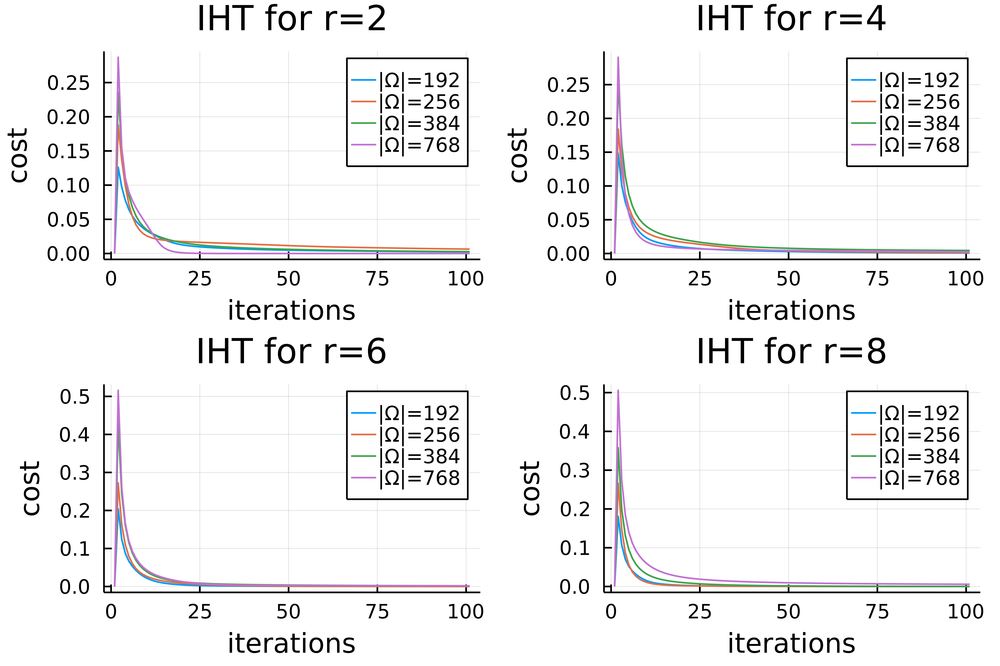

In [8]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="IHT for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        τ = 1.0
        iters = 100
        X_predict, cost_list = LRMCRec_IHT(Y, Ω, rank, τ, iters)
        error = norm(X_predict - X) / norm(X)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=1040)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

### 3.2.3 Iterative Shrinkage-Thresholding Algorithm (ISTA) (25%)

Design, implement, and run simple tests for ISTA (to solve the Lasso formulation) for low-rank matrix completion. Use the function name `LRMCRec_ISTA`. Provide necessary documentation. Use simulations to discuss the choice of parameters.

For Iterative Shrinkage-Thresholding Algorithm for low rank matrix completion, we start with the lasso formulation,
$$
        \frac{1}{2}\|y - \mathbb{A}(X)\|^2_2 + \lambda\|X\|_{tr}
$$
Where the $\|X\|_{tr}$ is the nuclear norm of X which is,

$$
        \|X\|_{tr} = \sum_{(i,j) \in \Omega}^r\sigma_i(B)
$$

$$
            \partial \|X\|_{tr} = \sum_{i = 1}^{min(m,n)} sign(\sigma_i)u_iv_i^T    
$$

The proximal operator of the nuclear norm is,
$$
\underset{X}{\operatorname{argmin}}\|X\|_{tr} + \frac{1}{2\gamma}\|X-Z\|^2_F
$$
$$
=\sum_{i = 1}^{min(m,n)}\eta(\sigma_i;\gamma)u_iv_i^T
$$

Let $f(X) = \frac{1}{2}\|y - \mathbb{A}(X)\|^2_2 $.
This can be used if we approximate the objective function as,
$$
f(X) + \lambda\|X\|_{tr}
\approx f(X^l) + <X-X^l,\nabla f(X^l)> + \frac{1}{2\tau^l}\|X-X^l\|^2_2 + \lambda\|X\|_{tr}
$$
$$
= \frac{1}{2\tau^l}\|X-(X^l - \tau^l\nabla f(X^l))\|^2_2 + \lambda\|X\|_{tr} + c
$$
This is very similar to the soft thresholding function given above for the proximal operator of the nuclear norm. Therefore the iteration is given by,
$$
X^{l+1} = \eta_{\sigma}(X^l + \tau^l\mathbb{A}^*(y-\mathbb{A}(X^l));\lambda\tau^l)
$$

Since the linear operator for our case is $\mathcal{P}_{\Omega}(\bm{X})$, the iteration will be as shown,

$$
X^{l+1} = S_{\lambda\tau}(X+t(\mathcal{P}_{\Omega}(Y)-\mathcal{P}_{\Omega}(X)))
$$

Therefore, we can use this soft thresholding function to update our X for each iteration in the code.

In [50]:
using Random
using LinearAlgebra
using StatsBase
using Distributions
using Plots

# Helper functions

function nuclear_norm(X)
    _, S, _ = svd(X)
    return sum(S)
end

function current_cost(X, Y, Ω, λ)
    return 0.5 * norm(X[Ω] - Y[Ω])^2 + λ * nuclear_norm(X)
end

function Singular_value_soft_threshold(X, λ)
    U, S, V = svd(X)
    threshold = max.(S .- λ, 0.0)
    return U * Diagonal(threshold) * V'
end

# Low Rank Matrix Completion Iterative Shrinkage Thresholding Algorithm.

function LRMCRec_ISTA(Y, Ω, λ, iterations)
    X = copy(Y)

    cost_list = zeros(iterations + 1)
    cost_list[1] = current_cost(X, Y, Ω, λ)

    for i=1:iterations
        X[Ω] = Y[Ω]
        X = Singular_value_soft_threshold(X, λ)

        cost_list[i+1] = current_cost(X, Y, Ω, λ)
    end

    return X, cost_list
end

LRMCRec_ISTA (generic function with 1 method)

In [10]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ISTA for r=$(rank)", ylabel="final error", xlabel="λ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_λ = []
        info_error = []

        for λ = 0.01:0.1:1.0
            iters = 100
            X_predict, cost_list = LRMCRec_ISTA(Y, Ω, λ, iters)
            error = norm(X_predict - X) / norm(X)

            push!(info_λ, λ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, λ, error))
        end

        plot!(plotter, info_λ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])


In [11]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ISTA for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        λ = 0.01
        iters = 100
        X_predict, cost_list = LRMCRec_ISTA(Y, Ω, λ, iters)
        error = norm(X_predict - X) / norm(X)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

### 3.2.4 Lasso-ADMM (25%)

Design, implement, and run simple tests for an ADMM algorithm (to solve the Lasso formulation) for low-rank matrix completion. Use the function name `LRMCRec_ADMM`. Provide necessary documentation. Compare ADMM and ISTA in terms of convergence.

In [44]:
# https://web.stanford.edu/~boyd/papers/pdf/admm_distr_stats.pdf

# Helper functions

function Singular_value_soft_threshold(X, λ)
    U, S, V = svd(X)
    threshold = max.(S .- λ, 0.0)
    return U * Diagonal(threshold) * V'
end

function nuclear_norm(X)
    _, S, _ = svd(X)
    return sum(S)
end

function current_cost(X, Y, Ω, λ)
    return 0.5 * norm(X[Ω] - Y[Ω])^2 + λ * nuclear_norm(X)
end

function LRMCRec_ADMM(Y, Ω, λ, τ, iters, error_diff_tresh)
    X = copy(Y)
    m, n = size(X)
    
    Z = zeros(Float64, m, n)
    V = zeros(Float64, m, n)

    cost_past = Inf
    cost = current_cost(X, Y, Ω, λ)
    counter = 0
    cost_list = []
    push!(cost_list, cost)
    while counter <= iters
        X = (Y + τ*(Z - V)) ./ (Ω .+ τ)
        Z = Singular_value_soft_threshold(X+V, λ/τ)
        V += X
        V -= Z

        cost = current_cost(X, Y, Ω, λ)
        push!(cost_list, cost)
        counter += 1

        if (cost_past - cost <= error_diff_tresh)
            break
        else
            cost_past = cost
        end
    end

    return X, counter, cost_list
end

LRMCRec_ADMM (generic function with 1 method)

In [45]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="final error", xlabel="λ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_λ = []
        info_error = []

        for λ = 0.01:0.01:0.25
            iters = 100
            τ = 0.5
            error_diff_thresh = 0.00001
            X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, τ, iters, error_diff_thresh)
            error = norm(X_predict - X) / norm(X)

            push!(info_λ, λ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, λ, error))
        end

        plot!(plotter, info_λ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

In [48]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

log = []

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="final error", xlabel="τ")

    for sample_idx = 1:length(samples)

        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)
        info_τ = []
        info_error = []

        for τ = 0.01:0.01:1
            iters = 100
            λ = 0.025
            error_diff_thresh = 0.00001
            X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, τ, iters, error_diff_thresh)
            error = norm(X_predict - X) / norm(X)

            push!(info_τ, τ)
            push!(info_error, error)

            push!(log, (rank, sample_ratio, τ, error))
        end

        plot!(plotter, info_τ, info_error, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

In [49]:
m, n = 32, 48

samples = [1/8, 1/6, 1/4, 1/2]

plot_arr = Plots.Plot{Plots.GRBackend}[]

for rank = 2:2:8
    X  = LRMC_data_gen(m, n, rank)
    plotter = plot(title="ADMM for r=$(rank)", ylabel="cost", xlabel="iterations")

    for sample_idx = 1:length(samples)
        sample_ratio = samples[sample_idx]
        Ω_sample = Int(m*n * sample_ratio)

        Y, Ω = Observation_samples(X, m, n, Ω_sample)

        λ = 0.025
        τ = 1
        error_diff_thresh = 0.00001
        iters = 100
        X_predict, counter, cost_list = LRMCRec_ADMM(Y, Ω, λ, τ, iters, error_diff_thresh)

        plot!(plotter, cost_list, label="|Ω|=$(Ω_sample)",fmt = :png, dpi=2080)
        ln = length(cost_list)
    end

    push!(plot_arr, plotter)
end

plot(plot_arr[1],plot_arr[2],plot_arr[3],plot_arr[4])

ln = 65
ln = 102
ln = 72
ln = 49
ln = 27
ln = 36
ln = 89
ln = 74
ln = 34
ln = 37
ln = 102
ln = 86
ln = 25
ln = 32
ln = 73
ln = 102


## Highlight

Please list a couple of highlights of your coursework that may impress your markers.